In [3]:
#!pip install twint

In [1]:
import pandas as pd
import numpy as np
import re
import twint
import nest_asyncio
from textblob import TextBlob
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords   
from datetime import datetime
import glob                     
import os
nest_asyncio.apply()

In [20]:
presidential_can={'Peter Obi':'peter obi',
                 'Bola Ahmed Tinubu':'bola ahmed tinubu',
                 'Atiku Abubakar':'atiku abubakar'}

In [21]:
def twint_configur(search_string):
    t = twint.Config()
    t.Search=search_string[1]
    t.Limit=500
    t.Pandas=True
    t.Pandas_au=True
    t.Pandas_clean=True
    t.Store_Object=True
    t.Since='2022-01-01'
    t.Until='2022-12-31'
    t.Lang='en'
    twint.run.Search(t)
    

In [29]:
def Run_Twint(search_val):
    #set empty dataframe for join
    output_df=pd.DataFrame()
    
    for candidate in search_val.items():
        print("running for search items:"+candidate[0]+"\n")
        print("search string :"+candidate[1]+"\n")
        
        #run twint
        twint_configur(candidate)
        
        #get dataframe
        
        tweets_df=twint.storage.panda.Tweets_df
        
        #join Dataframe and create  candidate column
        tweets_df['Candidate_name']=candidate[0]
        output_df=pd.concat([output_df,tweets_df])
    return output_df
        
        

In [30]:
tweets_df=Run_Twint(presidential_can)

running for search items:Peter Obi

search string :peter obi

1591709353840893952 2022-11-13 09:27:37 +0100 <thelastsalesman> @sweetsixtien @ChigozieIAlex @NgLabour @PeterObi  https://t.co/7txu5dJexf
1591709352075096067 2022-11-13 09:27:36 +0100 <Maxwelljohn313> @ali_saraki @JeffreyGuterman @PeterObi This is the more reason u should vote Obi...u need to be educated. Not waiting Agbado or regional divider to keep ur light brain lighter. Go and Get wisdom u need it badly. Sentimentality and tribalism has eaten u up. Better wake up before its too late.
1591709349948567552 2022-11-13 09:27:36 +0100 <Christo82578531> @JeffreyGuterman @PeterObi Context and issues of the moment influence social relationship. Be rest assured that Nigerians are happy with you support and won't take it for granted. You are highly welcome.
1591709342155558912 2022-11-13 09:27:34 +0100 <TkChristian11> BREAKING: Peter Obi, of the Labour Party, is the next President of Nigeria.   Retweet aggressively 💪💪💪
15917093276

1591708598392217600 2022-11-13 09:24:37 +0100 <leumas4samuel> @ChigozieIAlex @NgLabour You guys fail to understand that we are supporting labour party because of @PeterObi. So here is mainly a function of candidates and not party as we won't vote labour party from top to bottom
1591708564149649408 2022-11-13 09:24:28 +0100 <ShakaUtd> @Ben03507412 @MASalami_ @Oyinkitana According to Soludo, poverty rate was 53% under Obi. It declined to 14% last year (under Obiano). So Obiano brought down poverty rate from 53% to 14 % during his 8 year term. Remember Peter Obi was already in PDP and was probably supporting the PDP candidate for Governor.
1591708539344805889 2022-11-13 09:24:22 +0100 <pyzaroti> @AdemolaAwosanya @BME152521 @PeterObi I must tell say that you’re just a frosh in politics if you don’t know that it’s about numbers. Traditional rules are always paramount and play big roles in their societies. So wake up lad.
1591708537230692357 2022-11-13 09:24:22 +0100 <Apostlekay7> @Agbeti @S

1591707880511918080 2022-11-13 09:21:45 +0100 <FerdinandObiora> @blossommartins It is now clear that Peter obi is not a presidential candidate...or at least he is not a serious one.Why is Peter obi always following Wike?.He is part of Wike plan of destabilization.Only fools will continue to follow him.Wike is inviting him to commission a bridge and use him
1591707875105185793 2022-11-13 09:21:44 +0100 <abacityblog> Why Nigerians Should Blame Peter Obi not President Buhari for high unemployment – Oshiomhole  https://t.co/zX7qwMJspK  https://t.co/JsZ342W6m0
1591707870223302657 2022-11-13 09:21:43 +0100 <KcOfoegbu> Someone who imported his wife is mocking Peter Obi for importing goods that employ Nigerians and pays taxes.  Let me not share the rest of my thoughts😂
1591707809107922944 2022-11-13 09:21:28 +0100 <OlufemiOlaoseb3> @u_geelane @DeleFarotimi @AishaYesufu Peter Obi announced as the winner of the coming presidential election
1591707797338693636 2022-11-13 09:21:26 +0100 <edumaxx00

1591706826135031813 2022-11-13 09:17:34 +0100 <FutureMarsian> @IruefiNG @PeterObi Cry Cry baby. You can go back and continue with your political ambition and the OBIdient movement alone. You will certainly not be missed. No one is more important than others in this movement and you are not doing PO a favour by supporting him.
1591706825665159169 2022-11-13 09:17:34 +0100 <Apostlekay7> @Agbeti @Sirodue1 @YeleSowore @CCSoludo @PeterObi @channelstv @takeitback Sowore is not a bad person as bad people project him,thou they are haters ...
1591706816811274242 2022-11-13 09:17:32 +0100 <Sirodue1> @Agbeti @Apostlekay7 @YeleSowore @CCSoludo @PeterObi @channelstv @takeitback The mata tire me oh  https://t.co/qmpL5LcmMP
1591706815662030849 2022-11-13 09:17:31 +0100 <ReginaldOnyenwe> @YeleSowore @CCSoludo @PeterObi @channelstv @takeitback This is why nobody rates you. You will never discuss issues and solutions. This is not 1999. Nigerians have decided where to pitch their tent, and unfortunately,

1591706209526157314 2022-11-13 09:15:07 +0100 <TobiDee1> A new Nigeria is possible with #ObiDatti✅  Peter Obi is the solution ✅✅✅✅ Peter Obi is a movement ✅✅✅✅ Obident Is Better Than Sacrifice✅✅ We are Fully Obidient and Yusful✅✅ Labour Party Everywhere You Go✅✅  https://t.co/TUwgV6Fdwa
1591706188156227586 2022-11-13 09:15:02 +0100 <martinchidi> @whitesprings22 @PeterObi 🙏
1591706183500550146 2022-11-13 09:15:01 +0100 <HoroscopeBot> SAGITTARIUS ♐: You will wear blue shirts 7 days a week, but you will never see an honest person attacking Peter Obi.
1591706168061493248 2022-11-13 09:14:57 +0100 <Cherylking007> @DailyPostNGR APC never accept responsibility for their failures  That is why they keep failing &amp; will continue to fail  U can only improve when u admit ur failures  APC has blamed Jonathan, Obasanjo, Peter Obi, I won't be surprise if they blame Tafawa Belewa, Murtala Mohammed etc  No shame
1591706164362088448 2022-11-13 09:14:56 +0100 <legitngnews> Lagos Assembly Speaker, Muda

1591705475413938177 2022-11-13 09:12:12 +0100 <EmmyAngley> @whitenigerian @PeterObi
1591705470439686144 2022-11-13 09:12:11 +0100 <ifioksamet1> @JeffreyGuterman @PeterObi Well said.
1591705465179734016 2022-11-13 09:12:10 +0100 <MartynsObot> @shedracklaw @ChigozieIAlex @NgLabour @PeterObi My problem is still labour party. Their executive seems not to know how politics are played. They need to come out bold, I know without war chest, it's difficult for politicians to know their right in Nigeria. If Obi misses it, God forbid, LP will go back into extinction
1591705456002863111 2022-11-13 09:12:07 +0100 <steelwrld1> @cpadgreat @OkoyeCardinal @OselokaHObaze Afenifere south west women will support Peter Obi
1591705425032151040 2022-11-13 09:12:00 +0100 <nzubechukwuka1> @JeffreyGuterman @ObiDanielOnyeka @PeterObi We are not one with our oppressors those with different regional map, different languages, different cultures, different religions, different thinking and reasoning etc  Referendum 

1591704423570735104 2022-11-13 09:08:01 +0100 <DiplomaticSan> @Osiumar1 @ChigozieIAlex @NgLabour @PeterObi You guys are already accepting defeat. At least it is good to prepare for it so u don't get high BP when the results are announced.
1591704398983753729 2022-11-13 09:07:55 +0100 <Apostlekay7> @Agbeti @Sirodue1 @YeleSowore @CCSoludo @PeterObi @channelstv @takeitback  https://t.co/CyA9G6fwja
1591704350820372480 2022-11-13 09:07:44 +0100 <oneboylaidat> @RarePhilip @PeterObi Thank you @PeterObi
1591704349453193216 2022-11-13 09:07:44 +0100 <Apostlekay7> @Agbeti @Sirodue1 @YeleSowore @CCSoludo @PeterObi @channelstv @takeitback  https://t.co/XPZcNCncY5
1591704327915470848 2022-11-13 09:07:38 +0100 <OkeyAguE> @omoelerinjare @Dr_dabo1 @ChudeMedia @AbdulMahmud01 @PeterObi @NgLabour @akaebube @urchilla01 @Aikoges @DocOmeiza @doyinokupe Nigerians, one thing I have learnt &amp; wished everyone of us to learn from Mr Peter Obi is that "Good Name is better than silver &amp; gold" I know some pe

1591703794748108806 2022-11-13 09:05:31 +0100 <MadubaAugustine> @vanguardngrnews Peter obi is also the reason why he oshio hugely invested edo resources on a white woman. Obi is also the reason why the woman left him when the resources are no more coming. Oshio what is your own business line. What have you  contributed to Nigeria economy?
1591703788699922432 2022-11-13 09:05:30 +0100 <BabaYagaSE> @Postsubman Postsubman, she was simply stating how silly it sounds of @CCSoludo claim of investment made by @PeterObi on behalf of Ndị Anambra was worth next to nothing.
1591703749663330310 2022-11-13 09:05:21 +0100 <Heritag35225248> @ezek_o @Cicerorian_ Your principal is the one with synergy ba? Peter Gregory Obi will continue to be you lots nightmare, he &amp; ahmed yusuf datti is the synergy Nigeria needs right now. They will win &amp; retain power. Congratulations intelligent Nigerians for our choice of peterobidatti.
1591703748170383361 2022-11-13 09:05:20 +0100 <OhiozuaOtu_> @adamugarba 

1591703082898948096 2022-11-13 09:02:42 +0100 <solarsunpeace> @JoeJeffz @Spotlight_Abby It's Only Peter Obi. Jagaban and Atiku will make it worse
1591703056252637185 2022-11-13 09:02:35 +0100 <nnajiluchi> @adewole_c @McOzwazobia @PeterObi What you saying ?? 🙄
1591703048337997824 2022-11-13 09:02:33 +0100 <KojiMarwa> @Brakx_Bwala @intellectual316 @TrollFootball Shey Peter Obi don assure us say we go qualify 😂😂😂😂
1591703014569639938 2022-11-13 09:02:25 +0100 <Kysburnguinea> @DeleFarotimi @BebiaMichael Peter Obi
1591703012439097345 2022-11-13 09:02:25 +0100 <IMirrabel> @ebookaaa @PeterObi @Evaluv1231 @collinslove_ozi @magnificdude @_weyimi @Doc_steena Our pleasure 🙏
1591702957862846464 2022-11-13 09:02:12 +0100 <UkamakaPerpetua> @amindavison @BME152521 @PeterObi  https://t.co/hX4ZsKU21u
1591702951701118976 2022-11-13 09:02:10 +0100 <TTVObiDatti> Free posters available for pickup!!! @PeterObi @dattibabaahmed  Over 2000 copies #PeterObiForPresident2023  #Obidatti2023  #TakeBackNaija  https:

1591702373860544513 2022-11-13 08:59:52 +0100 <Generalmicrobio> @DeeOneAyekooto @inecnigeria calling @PeterObi an IPOB candidate is an offence against the Constitution and the electoral law. @Twitter @elonmusk Twitter as a platform shouldn't be used to spread ethnic hate. #BaifraCivilWar is a past no Nigerian want to see again ref:-eye witness and history
1591702368835760128 2022-11-13 08:59:51 +0100 <KushAlabi> They will come on Social Media to seek for likes and RTs for Tinubu but the minute an online poll is conducted and @PeterObi wins, they will say elections are not won on Social Media but una dey here dey look for RT. Enter street go find likes and retweet for Tinubu na 😆 #PO2023
1591702362145816576 2022-11-13 08:59:50 +0100 <Adeyemi_Dosumu> Obidients in Rivers State are you Ready???  @PeterObi will be commissioning a project for @GovWike in Port Harcourt on Nov. 17th.  This is a great opportunity to PRESS NECKS.  Israel Adesanya Simon Ekpa Arise TV Escobat Edo State Oba of Beni

1591701788410912768 2022-11-13 08:57:33 +0100 <DablinJessica> At this rate Oshiomhole will blame Peter Obi for the death of Jesus ..
1591701746774323201 2022-11-13 08:57:23 +0100 <IruefiNG> @DonCorleone_22 @PeterObi Yup, the way I no send your papa
1591701737219706881 2022-11-13 08:57:21 +0100 <jessetheoracle_> @izzyidee @breeejet @mrlurvy Peter Obi is the only Nigerian politician that I’ve seen being discriminated because he made an investment, rather than because he embezzled state funds.  Nigerians are not from this planet.
1591701730236198912 2022-11-13 08:57:19 +0100 <Kcfrank100> Day 13 reason why you must vote for Peter Obi come 2023 election. A vote for Peter Obi is a vote for liberating  Nigerians from corrupt political bondage.. Don't be deceived.. #PeterObi4President2023
1591701715283496961 2022-11-13 08:57:15 +0100 <Samdrew27881981> @JUWONREIS @YeleSowore @PeterObi @DImumolen We need tested and trusted people not experiment especially at this time in our history
159170170950

1591700812073517057 2022-11-13 08:53:40 +0100 <hrm_iykeism> @EttieneGandonu @MuchTalksBlog1 @PeterObi Oba gha topere
1591700782281551872 2022-11-13 08:53:33 +0100 <perryvee> @solakafinta @magnus_coker @PeterObi @basambo1 God bless you for all u do
1591700776761819136 2022-11-13 08:53:32 +0100 <Makavelli275> BREAKING: Peter Obi, of the Labour Party, is the next President of Nigeria.   Retweet aggressively 💪💪💪
1591700772546547712 2022-11-13 08:53:31 +0100 <EnwelumE> I don't even understand the angle of your own ranting sef. Are you comparing Elrufai's present achievement with Peter Obi's own of over 8yrs ago? Politics or not, always try to be fair in your judgment. Peter Obi is the best and will wipe the tears of the poor Nigerian masses.
1591700769769918464 2022-11-13 08:53:30 +0100 <AkinAdejola> @obi_Nwosu Unfortunately, The I dont fly private jets is a lie as Peter Obi now flies around in a branded private jet, no presidnetial candidate in recent history in Nigeria has done that. "we 

1591703547602673664 2022-11-13 09:04:32 +0100 <fortunate_amoo> 💥💥💥💥💥 Asiwaju Bola Ahmed Tinubu Supports Edo Flood Victims With N40m📌
1591703383555334144 2022-11-13 09:03:53 +0100 <nelsonitodo> via @Naija_PR: There are indications that the 22 APC governors will play major roles in raising campaign funds for  Bola Ahmed Tinubu
1591702983938813952 2022-11-13 09:02:18 +0100 <Naija_PR> There are indications that the 22 APC governors will play major roles in raising campaign funds for  Bola Ahmed Tinubu
1591702919413661697 2022-11-13 09:02:03 +0100 <ola_alademuniru> @g_makuachukwu3 @CCSoludo I urge the Nigerian security agencies not to treat this incident with levity, if they lose to Asiwaju Bola Ahmed Tinubu come 2023.
1591702898433351680 2022-11-13 09:01:58 +0100 <OyoNews1> A rally organised by the Obasa Youth Crusade (OYC) on Saturday saw thousands of Lagos residents declaring their support for candidates of the All Progressives Congress (APC) including Asiwaju Bola Ahmed Tinubu and Rt. H

1591695715864088582 2022-11-13 08:33:25 +0100 <Mardimagination> @hamstringFCB @Nero365 @Ben2Onyedika @Adebayor18 The earlier the better you know your next president Bola Ahmed Tinubu.  Stop the fake news and give up already
1591695584066686976 2022-11-13 08:32:54 +0100 <_weyimi> Friendly Reminder:   Bola Ahmed Tinubu primary school is uncertain, his Age is uncertain, and his name is uncertain.   One thing is certain bobo Chicago was involved in a drug case and his supporters are major enablers.
1591695356173365249 2022-11-13 08:31:59 +0100 <Obiorapaul10> Asiwaju Bola Ahmed Tinubu, V. P. Prof.Yemi Osinbajo, Gov.of Ogun, Osun &amp; Lagos States, Fmr Gov.of Ekiti State &amp; other  guests attend the Funeral  Service of Lady Grace Akeredolu, mother of the Gov.of Ondo Gov. Rotimi Akeredolu at the St Andrews Church in Owo, Ondo State.  #BAT  https://t.co/OP4VxVu82F
1591694910629253120 2022-11-13 08:30:13 +0100 <PO_GrassRootM> REMINDER:  The APC Presidential candidate, Bola Ahmed Tinubu was i

1591675998285795331 2022-11-13 07:15:04 +0100 <harrydaniyan> @OgechiOgechiike @inecnigeria Because it's NOT a new thing: this issue came up almost 20 years ago &amp; NOTHING was found on ASIWAJU BOLA AHMED TINUBU.  Bringing it up again almost 20 years later won't change the result of the investigation. The documents you saw have been in the public domain since 2003.  https://t.co/X2JfdWxm5j
1591675906241740800 2022-11-13 07:14:42 +0100 <RealOlaudah> That story too was buried. But it has refused to disappear. Last week, a certified true copy of court documents from the US District Court in Chicago, indicting Bola Ahmed Tinubu for drug trafficking and money laundering, resurfaced.
1591675344721154048 2022-11-13 07:12:28 +0100 <MBinAhly> Asiwaju Bola Ahmed Tinubu is coming.  We Believed 🇳🇬...  https://t.co/qCTkJbzzcN
1591675294062374912 2022-11-13 07:12:16 +0100 <RealOlaudah> will still be on file the documents he presented for admissions in 1969 when he was said to have left to the Unite

1591647555099713538 2022-11-13 05:22:03 +0100 <Austine77972671> A perfect song to be use for 2023 election campaign @SeunOsamaye APC woman are ready #AreyouReadyBySeunOsamaye  #MeetSeunBosedeOsamaye #SBO @PCAI @OfficialAPCNg  @BolaAhmedTinubu  https://t.co/MTTyh4RZm1
1591647530529574912 2022-11-13 05:21:57 +0100 <Austine77972671> @Seunosamaye @OfficialAPCNg @APCPresCC2022 @BolaAhmedTinubu @KashimSM A perfect song for 2023 election campaign #SeunOsamaye
1591647159883014145 2022-11-13 05:20:28 +0100 <EAOJesugbodofo> @renoomokri The enemy of my enemy can do the work of an ally in the life of my enemy. That doesn't make my enemy's enemy my friend at the end of the day. Thank you for that brilliant "demolition job" against the Asiwaju Bọla Ahmed Tinubu's Presidential Project 👍
1591646958686728192 2022-11-13 05:19:40 +0100 <StrawberryNG> The presidential candidate of the All Progressives Congress (APC), Asiwaju Bola Ahmed Tinubu, has said he would robustly engage the services of Nigerians in

1591554675345702914 2022-11-12 23:12:58 +0100 <AdelabuMustaph2> DELIBERATE PEDDLING OF FALSEHOOD AGAINST THE PERSON OF ASIWAJU BOLA AHMED TINUBU: FORGERY OF INEC PRESS RELEASE  cc @OfficialAPCNg @fkeyamo  https://t.co/kzYqVYo4ji  https://t.co/9WLEC5DhNy
1591553064573759488 2022-11-12 23:06:34 +0100 <Serr__Gastt> @llawal_latifah @jamesatts @Spotlight_Abby @DavidHundeyin @SavvyRinu @Sports_Doctor2 @raypaxful @Vawulence_Space @FS_Yusuf_ @urchilla01 @VictorIsrael_ @chymaker @itzz_blitz1 At what point does your conscience begin to prick you? Even in the face of evidence that Bola Ahmed Tinubu is a drug lord, You are still pushing for his presidency?  Ma’am, Oju gba mi ti fun yin o, with due respect.
1591552806334390274 2022-11-12 23:05:33 +0100 <nwokwujideofor1> #obidients living in the USA should come out in mass and protest against Bola Ahmed Tinubu. A drug lord and a money Launderer can never be a presidential candidate in Nigeria.
1591552580399898633 2022-11-12 23:04:39 +0100 <lugiboss>

1591539727240499201 2022-11-12 22:13:35 +0100 <zeemviano> @DarlingtonUsoh @DeeOneAyekooto @JoshuaEjike10 Based on their past achievements in the last and similar position held, Asiwaju Bola Ahmed Tinubu is far far ahead. And more competent than Pita. Also he has a clear cut plans for the country. (see renewal Hope Manifestos)
1591539101026729984 2022-11-12 22:11:05 +0100 <silvesterwies> Arise tv is been use by the opposition to mislead the public and tarnish the image of the personality of Ashiwaju Bola Ahmed Tinubu, this is clearly unprofessional of mainstream media organization.
1591538205693804546 2022-11-12 22:07:32 +0100 <Arcsizzle2> Agbadorians did not refute when Pablo Bola Ahmed Tinubu was exposed of forfeiting drug peddling funds but they are quick to refute letter which in a normal day @inecnigeria should be investigating the criminal presidential candidate. But this is Nigeria where criminals walk free
1591537986168291328 2022-11-12 22:06:39 +0100 <TONYONUMA> @ChimarokeNaman

1591522563510964225 2022-11-12 21:05:22 +0100 <HonJimohRashee1> BOLA AHMED TINUBU IS A INIMITABLE.  https://t.co/pKPTaMfPy1
1591521590071681024 2022-11-12 21:01:30 +0100 <NurudeenBale>  https://t.co/mY3JTSgC9B
1591521547432378371 2022-11-12 21:01:20 +0100 <DrAdamuGZango> @officialABAT The North is on it's way to prosperity come the incoming government of Asiwaju Bola Ahmed Tinubu. Mining of the North's vast mineral resources is a sure way for the North and Nigeria as a whole.
1591521063690973184 2022-11-12 20:59:25 +0100 <TinubuMediaS> Bola Ahmed Tinubu is an idea whose time has come.  https://t.co/3zj9dGDWRr
1591520652607262720 2022-11-12 20:57:47 +0100 <daily_trust> The Independent National electoral commission (INEC) has dismissed reports linking it with a purported investigation of criminal forfeiture against the presidential candidate of the All Progressives Congress (APC), Asiwaju Bola Ahmed Tinubu.   https://t.co/shfjLAPTLT
1591520427142426625 2022-11-12 20:56:53 +0100 <bossmukk

1591507322073153538 2022-11-12 20:04:49 +0100 <gddot>  https://t.co/PDdvYmUWsK
1591507074114113536 2022-11-12 20:03:49 +0100 <cocastic4> @Afosolex88 @Ben_addy05 @TinubuOclock This old record Peter Obi has taught you Obidients to play is broken already. You guys must be naive to think your nonsense prayer will stop many people  from voting Asiwaju Bola Ahmed Tinubu, making them feel guilty. If that's your idea of religion, you need a Psychologist.
1591506976873541632 2022-11-12 20:03:26 +0100 <kunle_kenny> Call his name!! Bola Ahmed Tinubu. That’s even if it’s his real name.
1591506648673419265 2022-11-12 20:02:08 +0100 <obuzor6119> The story surrounding Bola Ahmed Tinubu and Peter Obi is a lesson to be learnt in respect to a person’s past and future, the kind of life you choose to live today will definitely have an effect on your future.
1591506388588568578 2022-11-12 20:01:06 +0100 <StFreakingKezy> How many politician can survive the type of onslaught and fake news Asiwaju Bola Ahmed 

1591495647055974401 2022-11-12 19:18:25 +0100 <Progressive4BAT>  https://t.co/IuCJaUInl5
1591494869377335298 2022-11-12 19:15:20 +0100 <Yakubu_Prince1> He observed that the service (which had in attendance political leaders including serving and former Governors the APC Presidential Flagbearer Asiwaju Bola Ahmed Tinubu, several clerics and eminent Nigerians) is a most auspicious occasion for us to celebrate the Lord Jesus Christ  https://t.co/I47lqDWhth
1591494851215839232 2022-11-12 19:15:15 +0100 <M_haruna1>  https://t.co/noTUeV2YE3  Join @AbdulwaliTahir TODAY
1591494715836448775 2022-11-12 19:14:43 +0100 <Tinubufrontier> [PHOTO NEWS] Vice President Yemi Osinbajo, Ondo State Governor Oluwarotimi Akeredolu and his wife, APC Presidential Candidate Asiwaju Bola Ahmed Tinubu, Ogun State Governor Dapo Abiodun and Lagos State Governor Babajide Olusola Sanwo-Olu,… #funeral @RotimiAkeredolu @officialABAT  https://t.co/zIDNrLmfJk
1591494366845358081 2022-11-12 19:13:20 +0100 <segilolaa> Kindl

1591483966770774017 2022-11-12 18:32:00 +0100 <Godson19983230> @fkeyamo Despite all your lies to defend bola ahmed tinubu,still you are not ashamed of yourself I don't know how you managed to become SAN
1591483792480411650 2022-11-12 18:31:19 +0100 <Arcsizzle2> @jrnaib2 Is Arewa aware that Bola Ahmed Tinubu is a convicted drug baron?
1591483497390161926 2022-11-12 18:30:08 +0100 <Michael57012061> INEC responds to drug indictment of APC Presidential Flagbearer, Asiwaju Bola Ahmed Tinubu.  https://t.co/ViDUGOhuvJ
1591483055751172096 2022-11-12 18:28:23 +0100 <kcmanly> @AbdulMahmud01 @FS_Yusuf_ @DavidHundeyin @YouTube @YouTube Let the freedom of right information prevail, please the expected release of series by @DavidHundeyin on Bola Ahmed Tinubu's drug trafficking/money laundry case shouldn't be removed for it's benefit to the people of Nigeria in making their choices in the coming election.
1591482577646493697 2022-11-12 18:26:29 +0100 <ChimarokeNamani> When he took office in 1999, #ci

1591463624324825089 2022-11-12 17:11:10 +0100 <Asiwajukwara23> While Atiku was unable to fixed his party from the Presidential primaries crisis, this is Asiwaju Bola Ahmed Tinubu today in Ondo, three of the men laughing and cheering with him was once beneficiaries of his sacrifices to get things done, but chose to work clearly against him at  https://t.co/FTZUNitMl2
1591463138335272960 2022-11-12 17:09:14 +0100 <_omoiyaeleran> some instances with the recent the VP Yemi Osinbajo, but he was still able to put that behind, forgive, forget and let go completely.  Asiwaju Bola Ahmed Tinubu is a unifier!  #RenewedHope2023
1591463136128897024 2022-11-12 17:09:14 +0100 <GboyegaTechs> #PhotoSpeaks: I'm Asiwaju Bola Ahmed Tinubu @officialABAT  I'm your next president by the special grace of God.  I love you all.  #RENEWEDHOPE2023! #BATKSM23  https://t.co/dduwolDIbR
1591463134136500224 2022-11-12 17:09:13 +0100 <_omoiyaeleran> While Atiku was unable to fixed his party from the Presidential primar

1591446571132268544 2022-11-12 16:03:24 +0100 <BigFeco> @AbdulMahmud01 @DavidHundeyin @YouTube Pls do not take down the docu by @DavidHundeyin  exposing Bola Ahmed Tinubu, a Nigeria convicted in the United States of drug related offences. The said convict is contesting for president of our dear country Nigeria and must be vetted carefully.
1591446512055238656 2022-11-12 16:03:10 +0100 <SexyOmotee22> VP Yemi Osinbajo, Asiwaju Bola Ahmed Tinubu, Governor of Ogun, Osun and Lagos States, Former Governor of Ekiti State and other distinguished guests attend the Funeral Church Service of the mother of Governor Rotimi Akeredolu at the St Andrews Anglican Church in Owo, Ondo State  https://t.co/VBr7RSntWY
1591445924085104641 2022-11-12 16:00:50 +0100 <tundegboyinde> @osazenoo @Gen_Buhar God is about to bless you right in front of the people who tried to block you.Eliab was mean, insulting and condescending to David but that didn’t stop David from stepping into victory and promotion. It will be 

1591708949857853440 2022-11-13 09:26:00 +0100 <AdamuAlfaspk> @atiku The unifier of Nigeria Atiku Abubakar Insha Allah 2023
1591707646121635840 2022-11-13 09:20:49 +0100 <ougwuja> @mr_ochonogor This is not PDP rally bro, is a emir of katagum in Bauchi state coronation, Atiku Abubakar was in invited
1591706949736960002 2022-11-13 09:18:03 +0100 <pagaranni> @Bobbyxchange @kelvin2477 @channelstv As well as it is none of your business my decision to vote for Atiku Abubakar who will be declared winner come 2023
1591706862965358592 2022-11-13 09:17:43 +0100 <ElSalamat> @renoomokri PDP/Atiku Abubakar all the way
1591706784699682817 2022-11-13 09:17:24 +0100 <AlfredHassanatu> @TansiAlex @emmaikumeh @EmekaIhedioha Breaking news: Atiku Abubakar wants to quit the 2023 race because of the G5 governors but afraid of the mob.  Okowa is no longer interested.   Coming weeks will be interesting.  #votewisely
1591706623340429312 2022-11-13 09:16:46 +0100 <AlfredHassanatu> @TormentorPhD Breaking news: Ati

1591659548477358081 2022-11-13 06:09:42 +0100 <TOMIDE_raph> Atiku Abubakar is contagious! @PDPVanguard @OfficialPDPNig @_dinomelaye @atiku @atilary  https://t.co/xG4ILKVppQ
1591657398242279427 2022-11-13 06:01:09 +0100 <U_Rochas> @casicruise In politics you don't compare ant to elephant, you cannot compare a deceptive man, a media washed product to an upright man like Atiku Abubakar. What PO succeeded in doing is to marginalize igbos more. He know he's joking.
1591653992438038528 2022-11-13 05:47:37 +0100 <Dec_Uche> Atiku Abubakar vow to relocate Niger Delta ministry to Niger Delta, If elected.  https://t.co/GwEK4udAIt
1591653550320402434 2022-11-13 05:45:52 +0100 <Dec_Uche> Atiku Abubakar is an idea whose time has come #RecoverNigeria  https://t.co/CxADGpdprm
1591648032923488257 2022-11-13 05:23:57 +0100 <Donald88899549> @renoomokri Approach the court and sue him except your law practice is on arise TV and social media. Same with Daniel balwa who now speak for atiku abubakar but befor

1591525532067299332 2022-11-12 21:17:10 +0100 <AliyuUm14108105> PDP presidential candidate Atiku Abubakar attends the coronation ceremony of the Emir of Katagum in Bauchi state today  https://t.co/1SeamFxwaD
1591524531759611904 2022-11-12 21:13:12 +0100 <Auta_Musa_> Nigerians should shun drug dealers and vote Atiku Abubakar in the forthcoming general elections.  #DisqualifyTinubu.  https://t.co/o13O9RJ2en
1591523195563421696 2022-11-12 21:07:53 +0100 <mvccido_szn> His Excellency Alhaji Atiku Abubakar has again donated another N50m to victims of the tragic flood in Jigawa state.
1591522225357836288 2022-11-12 21:04:02 +0100 <itoya_lucky> "I Will Quit Campaigns If Anybody Can Prove I Accepted Land Gift As Anambra Gov" – Obi.  Can Ahmed Bola Tinubu Or Atiku Abubakar Confidently and Proudly Say This To Nigerians?  Please Go And Verify, Vote Accountability, Vote Character, Vote Transparency, Vote Peter Obi
1591522189630898178 2022-11-12 21:03:53 +0100 <badru75> Who wins Nigeria's presidenti

1591497370847825920 2022-11-12 19:25:16 +0100 <freshdealers> Vote #AtikuAbubakar and support #The300TrillionNairaPrivateSectorInvestmentStrategyForThe2023PDPPresidency  https://t.co/qin54wzs2U
1591497366481289216 2022-11-12 19:25:15 +0100 <freshdealers> Vote #AtikuAbubakar and support #The300TrillionNairaPrivateSectorInvestmentStrategyForThe2023PDPPresidency  https://t.co/nG30DaiMlo
1591496875185950721 2022-11-12 19:23:18 +0100 <DrOkaforEmmanu1> If you know how 2023 election is to me, you will just respect my choice of Atiku Abubakar. I cannot afford a country that's shattered by incompetent pseudo intellectuals with zero experience to govern.
1591496543512698881 2022-11-12 19:21:59 +0100 <freshdealers> Vote #AtikuAbubakar and support #The300TrillionNairaPrivateSectorInvestmentStrategyForThe2023PDPPresidency  https://t.co/VZYRnrRQjT
1591496405373407235 2022-11-12 19:21:26 +0100 <freshdealers> Vote #AtikuAbubakar and support #The300TrillionNairaPrivateSectorInvestmentStrategyForThe2023P

1591481909984784386 2022-11-12 18:23:50 +0100 <timomayor2> @BenDiaspora Tell me one thing you have heard from Atiku Abubakar that is inspiring? No one had heard him speak... I am not saying given speeches and edited video of interview. I mean actual debate. Notin.. but when you listen to Peter Obi you will see the difference. Peter Obi is a leader.
1591481520031662086 2022-11-12 18:22:17 +0100 <LeadershipNGA> Join us at 8pm, as we discuss the impact of the PDP G-5 governors on the presidential ambition of Atiku Abubakar. It promises to be an exciting conversation, don’t miss out!  https://t.co/fWw7pIu9ni
1591481284735684608 2022-11-12 18:21:21 +0100 <joeljacob202> @HAHayatu Till date, the race is still between Tinubu and Atiku Abubakar. Obi is just an arm of Atiku that's cut off, Kwankwaso is already acting as another arm. Atiku, Kwankwaso and Obi were all together in 2019 when Buhari beat hell out of them, it will be easier for the APC this time.
1591480911006404608 2022-11-12 18:19:5

1591459889309777920 2022-11-12 16:56:20 +0100 <MArewatop> Atiku Abubakar Ya Gana Da Tsohon Shugaban Kasar Nigeria IBB =&gt;  https://t.co/lm8ZcsmEPO
1591459682107133952 2022-11-12 16:55:30 +0100 <TormentorPhD> Buhari won twice without votes from SE and SS. He got 5% from the regions.   No President has won without the North. Check history.  Atiku Abubakar is the next president.  HE Atiku Abubakar GCFRN
1591459596795023361 2022-11-12 16:55:10 +0100 <AlwaysJayjam> OBJ pays glowing tribute to Alhaji Atiku Abubakar, calls him the best man in the Nigeria.   I love it when bosses gives sterling remarks on the stewardships of their subordinates  https://t.co/vDYwabbj2W
1591459378573742083 2022-11-12 16:54:18 +0100 <SegunMelchized1> Still on Atiku Abubakar's and his wife, Jenifer Abubakar's criminal activities  in the US and across many countries, the US Senate's Permanent Subcommittee on Investigations' Report, "Keeping Foreign Corruption Out of the United States: Four Case Histories" further

1591433581708324864 2022-11-12 15:11:47 +0100 <ifeanyispace> @EmperorEzemmuo @atiku He fail short in most of those qualities. Atiku Abubakar is the right man for 2023
1591433272135151616 2022-11-12 15:10:34 +0100 <okwong_wisdom> @atiku Atiku Abubakar, you're on a mission impossible. the majority elites in the northern region, youths inclusive have all taken position that Power rotation to the southern Nigeria comes 2023 and Bola Ahmed Tinubu is a favourable one. God bless the Incoming president of Nigeria
1591432950079528961 2022-11-12 15:09:17 +0100 <Abdullahi_wolf> H.E Alhaji Atiku Abubakar has again donated another N50m to victims of the tragic flood in Jigawa state.
1591432018738532352 2022-11-12 15:05:35 +0100 <agarra_wells> @atiku Sir, You've been outstanding among the rest &amp; am so proud of you sir. We really need to unite to solve the climate issues &amp; one way to do that is to join our hands together and ensure you LOSE next year.  Dear Atiku Abubakar, YOU WILL NEVER BE T

1591387348172156928 2022-11-12 12:08:05 +0100 <legitnghausa> Ana rade-radin cewa Goodluck Jonathan ya jawo Nyesom Wike, Samuel Ortom, Okezie Ikpeazu, Seyi Makinde da Ifeanyi Ugwuanyi suke fada da Atiku Abubakar   https://t.co/BqOLiqWJoN
1591387320720461824 2022-11-12 12:07:58 +0100 <Andym2d> Atiku Abubakar pledges to prioritise women, youth affairs if elected as president next year  https://t.co/6Yr9dhaeKC
1591387316198719488 2022-11-12 12:07:57 +0100 <tvnigerian> Atiku Abubakar pledges to prioritise women, youth affairs if elected as president next year  https://t.co/hOiWAcmbnS
1591386819924750337 2022-11-12 12:05:59 +0100 <Adamujadas> @SWAtiku2023 Alhaji atiku Abubakar
1591386148315615232 2022-11-12 12:03:18 +0100 <newsbeatportal> The PDP is currently undergoing a serious financial crisis following the decision of the G-5 Governors to work against the presidential election of Atiku Abubakar. The PDP and its presidential candidate has always relied upon the South to finance its campai

1591364696447209472 2022-11-12 10:38:04 +0100 <abbajidda13> Alhaji Atiku Abubakar has again donated another N50m to victims of flood in Jigawa state
1591364548036263936 2022-11-12 10:37:29 +0100 <FunnyBella1> Hadeja have not seen this number of people in a long while..  A great turn out for H.E Atiku Abubakar. #TeamAtiku #AtikuInJigawa  #AtikuVisitHadeja #RecoverNigeria  https://t.co/fBihGtKPQx
1591364316283953153 2022-11-12 10:36:33 +0100 <Gagarute> @fecomnet2 @ShehuItari No unity no progress as a nation. That is why nigeria need Atiku Abubakar as president to reset the country.
1591363821503143938 2022-11-12 10:34:35 +0100 <newsbeatportal> Are the revelations against PDP Presidential Candidate Atiku Abubakar nothing to go by? Are you not still touched by Deborah's death and ATIKU's denial? Are you not moved with his ethnic politics that it is the north alone that matters? Why will you vote for ATIKU Abubakar?
1591363540321193984 2022-11-12 10:33:28 +0100 <newsbeatportal> With all the

1591338652537589760 2022-11-12 08:54:35 +0100 <gchahal> JUST IN: #BNNNigeria Reports  The Presidential candidate of the Peoples Democratic Party (@OfficialPDPNig), Alhaji Atiku Abubakar (@atiku), has disclosed he plans to reactivate the Economic Community of West African States Monitoring Group (ECOMOG) to control border security.  https://t.co/heNhPkeB0I
1591337687264657409 2022-11-12 08:50:44 +0100 <Gagarute> Good morning sir. Here is a friendly reminder that Atiku Abubakar remains the most prepared candidate in the 2023 presidential election.  https://t.co/Il55FcmJ1z
1591337419495784448 2022-11-12 08:49:41 +0100 <jrnaib2> HE Atiku Abubakar donated N50M to the victims of flood in Jigawa state.
1591337222250582017 2022-11-12 08:48:54 +0100 <e_lopezofficial> @BrymOlawale Have you asked yourself why Obasanjo is not supporting his fellow Yoruba man and his Vice Atiku Abubakar?
1591336970445283334 2022-11-12 08:47:54 +0100 <Atrocioushub> Atiku Abubakar, the Peoples Democratic Party's nomi

1591330284946935808 2022-11-12 08:21:20 +0100 <Emmahumbles> Prof. CC. Soludo: If it isn't Bitterness, why Feign Ignorance?    By Chukwudịmma Aaron-Okonkwọ   Thread 👇🏼 Obidients South West #Davido Atiku Abubakar Benin Rufai  https://t.co/3BXpl06y9E
1591330183344422914 2022-11-12 08:20:55 +0100 <naijamadenurse> I LOVE THE FACT THAT NIGERIA WILL BE BOYCOTTING THE WORLD CUP BECAUSE OF HUMAN RIGHTS ABUSE IN QATAR 🇶🇦. 😎  ----------------------------------------  #OBIDIENTS #Newcastle Atiku Abubakar tomori apc and pdp  #AyraStarr labour party #Anambra  #BeninCity #ObidientlyOttified.
1591329640034992128 2022-11-12 08:18:46 +0100 <Jessehallidaygi> Facts For Facts!!   Obiano informed me He Saw Billions, &amp; the money he used to Build the International Airport in Anambra State was kept by Peter Obi   South West • Obidient • Finished • Atiku Abubakar • Rufai Oseni • #PeterObiForPresident2023 • #Dollar Aisha  https://t.co/scWkFykR5o
1591329510959378432 2022-11-12 08:18:15 +0100 <mba_phone_store>

1591318411631820801 2022-11-12 07:34:09 +0100 <jrnaib2> The North West zone alone will give HE Atiku Abubakar not less than 6M votes. Bookmark this tweet 📌
1591318311723470849 2022-11-12 07:33:45 +0100 <charlespromis4> @chacoreelnino @UchePOkoye Continue crying, Atiku Abubakar is your next president
1591318187592802304 2022-11-12 07:33:15 +0100 <charlespromis4> @Nwaejikevictor @UchePOkoye Atiku Abubakar is your next president
1591318030683758593 2022-11-12 07:32:38 +0100 <RukkyAbdullahi> Good Morning To All Atiku Abubakar Supporters, May Allah Provide For You All Your Needs........!!  ✌️✌️✌️✌️✌️
1591317835640238080 2022-11-12 07:31:51 +0100 <Mohamme88119925> A NEW NIGERIAN IS POSSIBLY UNDER THE LEADERSHIP OF ATIKU ABUBAKAR  GIVE HIM THAT CHANCE AND YOU WILL NEVER LIVE TO  REGRET:::  https://t.co/SakJUTbcAz
1591317793445711872 2022-11-12 07:31:41 +0100 <Chief__Adam> On security, H.E Atiku Abubakar said he would rely mainly on alternative approaches to dispute resolution, as against rely

1591267958520942592 2022-11-12 04:13:40 +0100 <lumazio4petobi> LUMAZIO 4 PETER OBI-DATTI #LUPOD  WHAT CAN YOU SAY ABOUT THIS PERSONALITY, LEADING A NATION. .......  *A REVEALING WRITE-UP ON ATIKU*  🇳🇬 *A County Ruled By Semi-illiterates Over The Years. As Permutations For 2023 Continues*  *_Still on Atiku Abubakar !!!_*  https://t.co/ErQxpo6Cgg
1591260061548281861 2022-11-12 03:42:17 +0100 <AmuludunOmoOwo> This is Jigawa today!   Everywhere you go' It's Atiku Abubakar 💯 Better Nigeria Is Assured...  https://t.co/QWzk6qOWC9
1591257252413198338 2022-11-12 03:31:07 +0100 <AbijorohM> Atiku abubakar and PDP should just step down for peter obi and labour party to avoid waste of resources and embarrassments,  https://t.co/109Q2GVmXS
1591246978163232768 2022-11-12 02:50:18 +0100 <Ibn___Ibrahim> Atiku Abubakar in Jigawa, just take a good look at how the beloved people of jigawa welcomed Atiku. @atiku @vote_Atiku2023 @Atiku_Nig_2023  https://t.co/PlJS4cvNAE
1591244031073583104 2022-11-12 02:38:3

In [31]:
pd.set_option('display.max_rows',10000)

In [32]:
pd.set_option('display.max_columns',10000)

In [33]:
pd.set_option('display.max_colwidth', None)

In [34]:
tweets_df

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,user_id,user_id_str,username,name,day,hour,link,urls,photos,video,thumbnail,retweet,nlikes,nreplies,nretweets,quote_url,search,near,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,Candidate_name
0,1591709353840893952,1591680276304113664,1.668328e+12,2022-11-13 09:27:37,+0100,,@sweetsixtien @ChigozieIAlex @NgLabour @PeterObi https://t.co/7txu5dJexf,qme,[],[],222966728,222966728,thelastsalesman,hustlefor.crypto ⚡,7,09,https://twitter.com/thelastsalesman/status/1591709353840893952,[],[https://pbs.twimg.com/media/FhbjN0YWIAAYSBx.jpg],1,https://pbs.twimg.com/media/FhbjN0YWIAAYSBx.jpg,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'sweetsixtien', 'name': 'Elle🌺', 'id': '1243577688184500226'}, {'screen_name': 'ChigozieIAlex', 'name': 'Chigozie I. Alex 4 Obi-Datti🇳🇬', 'id': '761086264757989376'}, {'screen_name': 'NgLabour', 'name': 'LabourPartyNG', 'id': '1529562333751689217'}]",,,,,Peter Obi
1,1591709352075096067,1591420263606161408,1.668328e+12,2022-11-13 09:27:36,+0100,,@ali_saraki @JeffreyGuterman @PeterObi This is the more reason u should vote Obi...u need to be educated. Not waiting Agbado or regional divider to keep ur light brain lighter. Go and Get wisdom u need it badly. Sentimentality and tribalism has eaten u up. Better wake up before its too late.,en,[],[],907160426408026112,907160426408026112,Maxwelljohn313,Maxwell john,7,09,https://twitter.com/Maxwelljohn313/status/1591709352075096067,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'ali_saraki', 'name': 'Sir Belló', 'id': '3924389537'}, {'screen_name': 'JeffreyGuterman', 'name': 'Dr. Jeffrey Guterman', 'id': '246103'}, {'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
2,1591709349948567552,1591420263606161408,1.668328e+12,2022-11-13 09:27:36,+0100,,@JeffreyGuterman @PeterObi Context and issues of the moment influence social relationship. Be rest assured that Nigerians are happy with you support and won't take it for granted. You are highly welcome.,en,[],[],1563844986751406084,1563844986751406084,Christo82578531,Christopher Ngara,7,09,https://twitter.com/Christo82578531/status/1591709349948567552,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'JeffreyGuterman', 'name': 'Dr. Jeffrey Guterman', 'id': '246103'}, {'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
3,1591709342155558912,1591709342155558912,1.668328e+12,2022-11-13 09:27:34,+0100,,"BREAKING: Peter Obi, of the Labour Party, is the next President of Nigeria. Retweet aggressively 💪💪💪",en,[],[],1491716048625803270,1491716048625803270,TkChristian11,More Blessing,7,09,https://twitter.com/TkChristian11/status/1591709342155558912,[],[],0,,False,0,0,0,,peter obi,,,,,,,[],,,,,Peter Obi
4,1591709327609438208,1591709327609438208,1.668328e+12,2022-11-13 09:27:30,+0100,,Peter Obi supporters about to do a CARNIVAL in Port Harcourt. Wike dey mad ABEG.,en,[],[],1005180128966701056,1005180128966701056,FAGalileo,Galileo,7,09,https://twitter.com/FAGalileo/status/1591709327609438208,[],[],0,,False,0,0,0,https://twitter.com/iamtenseven/status/1591692278757789696,peter obi,,,,,,,[],,,,,Peter Obi
5,1591709324006789120,1591540915939819522,1.668328e+12,2022-11-13 09:27:30,+0100,,@AyamTjay @Jack_ng01 @PeterObi Who and who did he invite?,en,[],[],1491558504141836294,1491558504141836294,Nandikinggg,NANGATE♟️🖥️,7,09,https://twitter.com/Nandikinggg/status/1591709324006789120,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'AyamTjay', 'name': 'Ä D É P Ô J Û', 'id': '1047668071'}, {'screen_name': 'Jack_ng01', 'name': 'J a c k 🇳🇬', 'id': '1215978204734861312'}, {'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
6,1591709322874060800,1591419750969655298,1.668328e+12,2022-11-13 09:27:29,+0100,,@Jaswable @Yola_Twitta @atiku Not serial contender but serial looser... At

In [35]:
tweets_df.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest', 'Candidate_name'],
      dtype='object')

In [37]:
tweets_df['Candidate_name'].unique()

array(['Peter Obi', 'Bola Ahmed Tinubu', 'Atiku Abubakar'], dtype=object)

In [38]:
# drop all rows that language is not english
tweets_df['language'].unique()

array(['qme', 'en', 'und', 'pl', 'qam', 'de', 'in', 'pt', 'ro', 'lv',
       'tl', 'ca', 'zxx', 'es', 'sl', 'tr', 'ht', 'vi'], dtype=object)

In [39]:
tweets_df=tweets_df[tweets_df['language'].isin(['en'])]

In [40]:
tweets_df['language'].unique()

array(['en'], dtype=object)

In [41]:
tweets_df

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,user_id,user_id_str,username,name,day,hour,link,urls,photos,video,thumbnail,retweet,nlikes,nreplies,nretweets,quote_url,search,near,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,Candidate_name
1,1591709352075096067,1591420263606161408,1.668328e+12,2022-11-13 09:27:36,+0100,,@ali_saraki @JeffreyGuterman @PeterObi This is the more reason u should vote Obi...u need to be educated. Not waiting Agbado or regional divider to keep ur light brain lighter. Go and Get wisdom u need it badly. Sentimentality and tribalism has eaten u up. Better wake up before its too late.,en,[],[],907160426408026112,907160426408026112,Maxwelljohn313,Maxwell john,7,09,https://twitter.com/Maxwelljohn313/status/1591709352075096067,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'ali_saraki', 'name': 'Sir Belló', 'id': '3924389537'}, {'screen_name': 'JeffreyGuterman', 'name': 'Dr. Jeffrey Guterman', 'id': '246103'}, {'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
2,1591709349948567552,1591420263606161408,1.668328e+12,2022-11-13 09:27:36,+0100,,@JeffreyGuterman @PeterObi Context and issues of the moment influence social relationship. Be rest assured that Nigerians are happy with you support and won't take it for granted. You are highly welcome.,en,[],[],1563844986751406084,1563844986751406084,Christo82578531,Christopher Ngara,7,09,https://twitter.com/Christo82578531/status/1591709349948567552,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'JeffreyGuterman', 'name': 'Dr. Jeffrey Guterman', 'id': '246103'}, {'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
3,1591709342155558912,1591709342155558912,1.668328e+12,2022-11-13 09:27:34,+0100,,"BREAKING: Peter Obi, of the Labour Party, is the next President of Nigeria. Retweet aggressively 💪💪💪",en,[],[],1491716048625803270,1491716048625803270,TkChristian11,More Blessing,7,09,https://twitter.com/TkChristian11/status/1591709342155558912,[],[],0,,False,0,0,0,,peter obi,,,,,,,[],,,,,Peter Obi
4,1591709327609438208,1591709327609438208,1.668328e+12,2022-11-13 09:27:30,+0100,,Peter Obi supporters about to do a CARNIVAL in Port Harcourt. Wike dey mad ABEG.,en,[],[],1005180128966701056,1005180128966701056,FAGalileo,Galileo,7,09,https://twitter.com/FAGalileo/status/1591709327609438208,[],[],0,,False,0,0,0,https://twitter.com/iamtenseven/status/1591692278757789696,peter obi,,,,,,,[],,,,,Peter Obi
5,1591709324006789120,1591540915939819522,1.668328e+12,2022-11-13 09:27:30,+0100,,@AyamTjay @Jack_ng01 @PeterObi Who and who did he invite?,en,[],[],1491558504141836294,1491558504141836294,Nandikinggg,NANGATE♟️🖥️,7,09,https://twitter.com/Nandikinggg/status/1591709324006789120,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'AyamTjay', 'name': 'Ä D É P Ô J Û', 'id': '1047668071'}, {'screen_name': 'Jack_ng01', 'name': 'J a c k 🇳🇬', 'id': '1215978204734861312'}, {'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
6,1591709322874060800,1591419750969655298,1.668328e+12,2022-11-13 09:27:29,+0100,,@Jaswable @Yola_Twitta @atiku Not serial contender but serial looser... Atiku and tinubu will loose to @PeterObi,en,[],[],1516426536286625793,1516426536286625793,CrownPrin5,President OBI,7,09,https://twitter.com/CrownPrin5/status/1591709322874060800,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'Jaswable', 'name': 'Chuku Mmuo Nso.', 'id': '228719614'}, {'screen_name': 'Yola_Twitta', 'name': 'Yola Twittèr Connect', 'id': '1230791672960880643'}, {'screen_name': 'atiku', 'name': 'Atiku Abubakar', 'id': '177583133'}]",,,,,Peter Obi
7,1591709319032344576,1591709319032344576,1.668328e+12,2022-11-13 09:27:28,+0100,,"To some of us @PeterObi presidency is a breath of fresh air, the broken system y'all fighting to retain has been choking us for too long and one more 

In [42]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1292 entries, 1 to 517
Data columns (total 39 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               1292 non-null   object 
 1   conversation_id  1292 non-null   object 
 2   created_at       1292 non-null   float64
 3   date             1292 non-null   object 
 4   timezone         1292 non-null   object 
 5   place            1292 non-null   object 
 6   tweet            1292 non-null   object 
 7   language         1292 non-null   object 
 8   hashtags         1292 non-null   object 
 9   cashtags         1292 non-null   object 
 10  user_id          1292 non-null   int64  
 11  user_id_str      1292 non-null   object 
 12  username         1292 non-null   object 
 13  name             1292 non-null   object 
 14  day              1292 non-null   int64  
 15  hour             1292 non-null   object 
 16  link             1292 non-null   object 
 17  urls           

In [47]:
tweets_df = tweets_df.drop_duplicates(subset=["tweet","Candidate_name"],keep="first")

In [49]:
#tweets_df.info()

In [50]:
def clean_text(text):  
    pat1 = r'@[^ ]+'                   #@signs
    pat2 = r'https?://[A-Za-z0-9./]+'  #links
    pat3 = r'\'s'                      #floating s's
    pat4 = r'\#\w+'                     # hashtags
    pat5 = r'&amp '
    pat6 = r'[^A-Za-z\s]'         #remove non-alphabet
    combined_pat = r'|'.join((pat1, pat2,pat3,pat4,pat5, pat6))
    text = re.sub(combined_pat,"",text).lower()
    return text.strip() 

In [51]:
tweets_df["tweet"] = tweets_df["tweet"].apply(clean_text)

C:\Users\kafayat\AppData\Local\Temp\ipykernel_116\2228119172.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_df["tweet"] = tweets_df["tweet"].apply(clean_text)


In [53]:
tweets_df['tweet'].sample(5)

274    people shuld remember that there are chapters of their life they dont like reading out loud in the public so before they run their mouth they should check their life first  thought he can shame  through his speech on  see his own second to nothing
127                                                                                                                                                                  arise tv you will hang president bola ahmed tinubu gcfr portrait in your office next year
145                                                                                                                                             so now oshiomhole has stopped blaming the pdp and is now blaming peter obi  how absurd and low can this man go
49                                                                                                                                                                                                                            tell them bro

In [54]:
print('Running sentiment process')
# creating two new columns(polarity and subjecivity)
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

tweets_df['subjectivity']= tweets_df['tweet'].apply(getSubjectivity)
tweets_df['polarity']= tweets_df['tweet'].apply(getPolarity)

Running sentiment process


C:\Users\kafayat\AppData\Local\Temp\ipykernel_116\3416392892.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_df['subjectivity']= tweets_df['tweet'].apply(getSubjectivity)
C:\Users\kafayat\AppData\Local\Temp\ipykernel_116\3416392892.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_df['polarity']= tweets_df['tweet'].apply(getPolarity)


In [56]:
tweets_df[['polarity','subjectivity','tweet']]

,polarity,subjectivity,tweet
1,8.000000e-02,0.593333,this is the more reason u should vote obiu need to be educated not waiting agbado or regional divider to keep ur light brain lighter go and get wisdom u need it badly sentimentality and tribalism has eaten u up better wake up before its too late
2,5.444444e-01,0.655556,context and issues of the moment influence social relationship be rest assured that nigerians are happy with you support and wont take it for granted you are highly welcome
3,0.000000e+00,0.000000,breaking peter obi of the labour party is the next president of nigeria retweet aggressively
4,-6.250000e-01,1.000000,peter obi supporters about to do a carnival in port harcourt wike dey mad abeg
5,0.000000e+00,0.000000,who and who did he invite
6,-7.692308e-02,0.269231,not serial contender but serial looser atiku and tinubu will loose to
7,-1.437500e-01,0.564583,to some of us presidency is a breath of fresh air the broken system yall fighting to retain has been choking us for too long and one more bad government will be devastating to a whole lot of us so spare me that obidients are emotional talk we just wanna breath man
8,-2.500000e-01,0.888889,your election in as the prophesy comes says you will re write the electoral map i dont know know that the electoral map is so when god says you will re write im not sure what it means regardless you will be elected president in
9,0.000000e+00,0.000000,my brother naa soo peter obi all the way
10,3.666667e-01,0.700000,peter obi is clean oba admonishes


In [57]:
# creating column that indicate if the tweet is positive, negative or neutral
def Analyse(score):
    if score < 0:
        return 'Negative'
    elif score ==0:
        return 'Neutral'
    else:
        return 'Positve'
tweets_df['Analysis']=tweets_df['polarity'].apply(Analyse)

C:\Users\kafayat\AppData\Local\Temp\ipykernel_116\1151417897.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_df['Analysis']=tweets_df['polarity'].apply(Analyse)


In [58]:
tweets_df['date']=pd.to_datetime(tweets_df['date'])

C:\Users\kafayat\AppData\Local\Temp\ipykernel_116\2728287911.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_df['date']=pd.to_datetime(tweets_df['date'])


In [59]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1283 entries, 1 to 517
Data columns (total 42 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   id               1283 non-null   object        
 1   conversation_id  1283 non-null   object        
 2   created_at       1283 non-null   float64       
 3   date             1283 non-null   datetime64[ns]
 4   timezone         1283 non-null   object        
 5   place            1283 non-null   object        
 6   tweet            1283 non-null   object        
 7   language         1283 non-null   object        
 8   hashtags         1283 non-null   object        
 9   cashtags         1283 non-null   object        
 10  user_id          1283 non-null   int64         
 11  user_id_str      1283 non-null   object        
 12  username         1283 non-null   object        
 13  name             1283 non-null   object        
 14  day              1283 non-null   int64   

In [60]:
tweets_df.to_csv('presi_candidate_sentiment.csv', index=False)

In [2]:
df=pd.read_csv('presi_candidate_sentiment.csv')
df.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,Candidate_name,subjectivity,polarity,Analysis
0,1591709352075096067,1591420263606161408,1.668328e+12,2022-11-13 09:27:36,100,NaN,this is the more reason u should vote obiu nee...,en,[],[],...,NaN,"[{'screen_name': 'ali_saraki', 'name': 'Sir Be...",NaN,NaN,NaN,NaN,Peter Obi,0.593333,0.080000,Positve
1,1591709349948567552,1591420263606161408,1.668328e+12,2022-11-13 09:27:36,100,NaN,context and issues of the moment influence soc...,en,[],[],...,NaN,"[{'screen_name': 'JeffreyGuterman', 'name': 'D...",NaN,NaN,NaN,NaN,Peter Obi,0.655556,0.544444,Positve
2,1591709342155558912,1591709342155558912,1.668328e+12,2022-11-13 09:27:34,100,NaN,breaking peter obi of the labour party is the ...,en,[],[],...,NaN,[],NaN,NaN,NaN,NaN,Peter Obi,0.000000,0.000000,Neutral
3,1591709327609438208,1591709327609438208,1.668328e+12,2022-11-13 09:27:30,100,NaN,peter obi supporters about to do a carnival in...,en,[],[],...,NaN,[],NaN,NaN,NaN,NaN,Peter Obi,1.000000,-0.625000,Negative
4,1591709324006789120,1591540915939819522,1.668328e+12,2022-11-13 09:27:30,100,NaN,who and who did he invite,en,[],[],...,NaN,"[{'screen_name': 'AyamTjay', 'name': 'Ä D É P ...",NaN,NaN,NaN,NaN,Peter Obi,0.000000,0.000000,Neutral


In [3]:
df.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest', 'Candidate_name', 'subjectivity', 'polarity', 'Analysis'],
      dtype='object')

In [4]:
col=['id','conversation_id','username','name','day','hour','created_at','date','tweet','language','user_id','retweet','Candidate_name','subjectivity','polarity','Analysis']
df2=df[col]
df2.head()

,id,conversation_id,username,name,day,hour,created_at,date,tweet,language,user_id,retweet,Candidate_name,subjectivity,polarity,Analysis
0,1591709352075096067,1591420263606161408,Maxwelljohn313,Maxwell john,7,9,1.668328e+12,2022-11-13 09:27:36,this is the more reason u should vote obiu nee...,en,907160426408026112,False,Peter Obi,0.593333,0.080000,Positve
1,1591709349948567552,1591420263606161408,Christo82578531,Christopher Ngara,7,9,1.668328e+12,2022-11-13 09:27:36,context and issues of the moment influence soc...,en,1563844986751406084,False,Peter Obi,0.655556,0.544444,Positve
2,1591709342155558912,1591709342155558912,TkChristian11,More Blessing,7,9,1.668328e+12,2022-11-13 09:27:34,breaking peter obi of the labour party is the ...,en,1491716048625803270,False,Peter Obi,0.000000,0.000000,Neutral
3,1591709327609438208,1591709327609438208,FAGalileo,Galileo,7,9,1.668328e+12,2022-11-13 09:27:30,peter obi supporters about to do a carnival in...,en,1005180128966701056,False,Peter Obi,1.000000,-0.625000,Negative
4,1591709324006789120,1591540915939819522,Nandikinggg,NANGATE♟️🖥️,7,9,1.668328e+12,2022-11-13 09:27:30,who and who did he invite,en,1491558504141836294,False,Peter Obi,0.000000,0.000000,Neutral


In [5]:
tweet_time=pd.DataFrame(df2.groupby(['Candidate_name','hour'])['polarity'].mean())


In [6]:
pivot_t=pd.pivot_table(tweet_time, index='hour', columns='Candidate_name',values='polarity', aggfunc='mean')
pivot_t.head()

Candidate_name,Atiku Abubakar,Bola Ahmed Tinubu,Peter Obi
hour,,,
0,0.192083,0.193333,NaN
1,0.006647,0.068750,NaN
2,0.077381,-0.138889,NaN
3,0.107407,0.084722,NaN
4,0.000000,-0.056096,NaN


In [8]:
#|df2.groupby(['Candidate_name'])['hour'].value_counts()

In [11]:
df2.Candidate_name.count()

1283

In [35]:
df2['Candidate_name'].value_counts()

Peter Obi            467
Atiku Abubakar       418
Bola Ahmed Tinubu    398
Name: Candidate_name, dtype: int64

In [36]:
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline

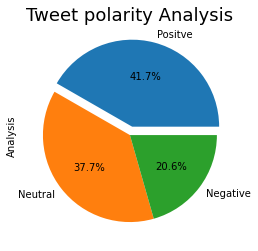

In [40]:
x=df2['Analysis'].value_counts()
x.plot(kind='pie', autopct='%1.1f%%',explode=(0.1,0,0))
plt.title('Tweet polarity Analysis', fontsize=18);

In [53]:
# not necessary
def plot_count(var):
    color=sb.color_palette()[0]
    ax=sb.countplot(data=new_df,y=var, order=new_df[var].value_counts().index,color=color)
    abs_values=new_df[var].value_counts()
    rel_values=new_df[var].value_counts(normalize=True).values * 100
    lbls=[f'{p[1]:.0f}%' for p in zip(abs_values,rel_values)]
    ax.bar_label(container=ax.containers[0], labels=lbls);
    ax.set_title(f'The distribution of transaction by {var}')

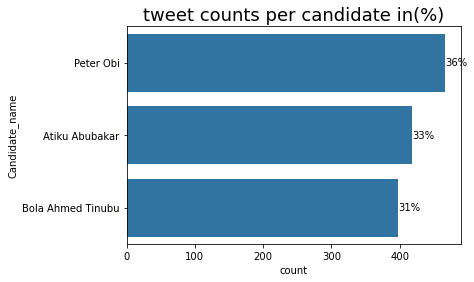

In [51]:
can_order=df2['Candidate_name'].value_counts()
order=can_order.index
color=sb.color_palette()[0]
order
ax=sb.countplot(data=df2, y='Candidate_name',order=order, color=color)
rel_values=df2['Candidate_name'].value_counts(normalize=True).values * 100
lbls=[f'{p[1]:.0f}%' for p in zip(can_order, rel_values)]
ax.bar_label(container=ax.containers[0], labels=lbls)
ax.set_title('tweet counts per candidate in(%)', fontsize=18);

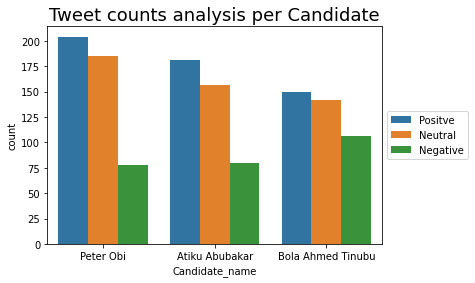

In [52]:
#color=sb.color_palette()[2]
sb.countplot(data=df2,x='Candidate_name',hue='Analysis', order=order)
plt.title('Tweet counts analysis per Candidate', fontsize=18)
plt.legend(loc='center left',bbox_to_anchor=(1,0.5));